<div style="text-align: right">INFO 6105 Data Science Eng Methods and Tools</div>
<div style="text-align: right">Dhanur Motwani, Suman Rawat, Mansi Agarwal</div>

# Final Project : 
# The Battle Of Kurukshetra #

BhagwadGita is one longest epic ever written.

Here this project is trying to look at epic from the Data Science perspective.

It one of the oldest scripture and part of Indian history. Some may say it once again story of Good vs Evil. But that would not justify the literature. It is a story where no one is bad or good. But based on time and decision taken that justify the future event. The Mahabharata is the longest known epic poem and has been described as "the longest poem ever written".Its longest version consists of over 100,000 shloka or over 200,000 individual verse lines (each shloka is a couplet), and long prose passages. About 1.8 million words in total, the Mahabharata is roughly ten times the length of the Iliad and the Odyssey combined, or about four times the length of the Ramayana

</br >
<center>
<img src="mahabharata_images/first.jpg" width=600 />
</center>

# Part 1 : Initial Explorations

In order to study the depiction of the characters, we framed certain intial questions :

    How frequently are these charachters mentioned ?
    Which charachters are frequently mentioend with Karna and Arjuna?
    How are Karna and Arjuna described qualitatively in the book?

Mahabharata is composed of 18 books and has multiple sections with each. (while some have 6 sections, other have 200)
Once the dataset reached its most modular level. we could proceed with carrying out the actual analysis - figuring out the characters mentioned around Karna and Arjuna, figuring out the adjectives used around them (POS - Part of Speech tagging in spaCy).Also, how ahve their names changed in the text.

In [30]:
import io
import pandas as pd
import numpy as np
from pprint import pprint
import nltk
import matplotlib.pyplot as plt
%matplotlib inline
figure_size =[10,5]
plt.rcParams["figure.figsize"] = figure_size

# 1. Load Data

In [31]:
f = open("C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/mahafull.txt", "r", encoding ='utf8')
mhb_text = f.read()

# 2. Split Book into parts.

In [ ]:
mhb_books = mhb_text.split('BOOK')
# No. of books
mhb_refined = mhb_books[1:]
mhb_refined
len(mhb_refined)


In [33]:
# Getting book title Sample
title = mhb_refined[0].split("\n")
title

[' 1',
 '',
 'ADI PARVA',
 '',
 "TRANSLATOR'S PREFACE",
 '',
 'The object of a translator should ever be to hold the mirror upto his',
 'author. That being so, his chief duty is to represent so far as',
 "practicable the manner in which his author's ideas have been expressed,",
 'retaining if possible at the sacrifice of idiom and taste all the',
 "peculiarities of his author's imagery and of language as well. In regard",
 'to translations from the Sanskrit, nothing is easier than to dish up',
 'Hindu ideas, so as to make them agreeable to English taste. But the',
 'endeavour of the present translator has been to give in the following',
 'pages as literal a rendering as possible of the great work of Vyasa. To',
 'the purely English reader there is much in the following pages that will',
 'strike as ridiculous. Those unacquainted with any language but their own',
 'are generally very exclusive in matters of taste. Having no knowledge of',
 'models other than what they meet with in their

In [34]:
#get the Book Title, book no.
book_titles=[]
for i in range(len(mhb_refined)):
    book_title = mhb_refined[i].split("\n")[2]
    book_titles.append(book_title)
book_titles

['ADI PARVA',
 'SABHA PARVA',
 'VANA PARVA',
 'VIRATA PARVA',
 'UDYOGA PARVA',
 'BHISHMA PARVA',
 'DRONA PARVA',
 'KARNA-PARVA',
 'SHALYA-PARVA',
 'SAUPTIKA-PARVA',
 'STRI-PARVA',
 'SANTI PARVA',
 'ANUSASANA PARVA',
 'ASWAMEDHA PARVA',
 'ASRAMAVASIKA PARVA',
 'MAUSALA-PARVA',
 'MAHAPRASTHANIKA PARVA',
 'SVARGAROHANIKA-PARVA']

In [35]:
chars = [ "Karna", "Arjuna"]

# 3. Dividing Books into sections as each book has several sections

# Refine
Further break down the books to get the following elements in its structure.

    * sections
    * sentences
    * words



In [36]:
# Sections of all the books + Content of all the books
sections_of_book =[ "Book_no"+ '\t'+"Book" + "\t" + "Section" + '\t' + "Content"]
sections_of_book
Total_Books = len(mhb_refined)
for i in range(Total_Books):
    book_num = mhb_refined[i].split("\n")[0]
    book_title = mhb_refined[i].split("\n")[2]
    section_per_book = mhb_refined[i].split("SECTION")[1:]
    total_section = len(section_per_book)
    for j in range(total_section):
        section_nm = book_num + '\t' + book_title + '\t' + str(section_per_book[j].split("\n")[0].strip()) + '\t' + str(section_per_book[j].split("\n")[1:])
        sections_of_book.append(section_nm)
sections_of_book[280]
#len(sections_of_book)

' 2\tSABHA PARVA\tXLIV\t[\'\', \'"Vaisampayana said,--Hearing these words of Bhishma, the ruler of Chedi\', \'endued with exceeding prowess, desirous of combating with Vasudeva\', \'addressed him and said,--O Janarddana, I challenge thee. Come, fight with\', \'me until I slay thee today with all the Pandavas. For, O Krishna, the\', \'sons of Pandu also, who disregarding the claims of all these kings, have\', \'worshipped thee who art no king, deserve to be slain by me along with\', \'thee. Even this is my opinion, O Krishna, that they who from childishness\', \'have worshipped thee, as if thou deservest it, although thou art unworthy\', \'of worship, being only a slave and a wretch and no king, deserve to be\', "slain by me.\' Having said this, that tiger among kings stood there", \'roaring in anger. And after Sisupala had ceased, Krishna addressing all\', \'the kings in the presence of the Pandavas, spoke these words in a soft\', "voice.--\'Ye kings, this wicked-minded one, who is the

In [37]:
# Creating new files Section wise
with open ("C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/mhb_sections.txt",'w')as new_File:
    for x  in sections_of_book:
        new_File.write(x + '\n')

In [38]:
df_mhb =pd.read_csv("C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/mhb_sections.txt", sep ='\t')
df_mhb.head()

,Book_no,Book,Section,Content
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na..."
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi..."
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana..."
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,..."
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak..."


In [39]:
df_mhb['Content'][1]

'[\'\', \'"The Rishis said, \\\'O son of Suta, we wish to hear a full and\', "circumstantial account of the place mentioned by you as Samanta-panchaya.\'", \'\', \'"Sauti said, \\\'Listen, O ye Brahmanas, to the sacred descriptions I utter\', \'O ye best of men, ye deserve to hear of the place known as\', \'Samanta-panchaka. In the interval between the Treta and Dwapara Yugas,\', \'Rama (the son of Jamadagni) great among all who have borne arms, urged by\', \'impatience of wrongs, repeatedly smote the noble race of Kshatriyas. And\', \'when that fiery meteor, by his own valour, annihilated the entire tribe\', \'of the Kshatriyas, he formed at Samanta-panchaka five lakes of blood. We\', \'are told that his reason being overpowered by anger he offered oblations\', \'of blood to the manes of his ancestors, standing in the midst of the\', \'sanguine waters of those lakes. It was then that his forefathers of whom\', "Richika was the first having arrived there addressed him thus, \'O Rama, O

#  4. Function for finding multiple occurences of a charachter names 

</br >
<center>
<img src="mahabharata_images/arjun.jfif" width=600 />
</center>

In [40]:
Arjun_names = ["Arjuna", "Partha", "Dhananjaya", "Gudakesa", "Phalguni", 
               "Vijaya","Savyasachin","Vibhatsu","Kiritin","Jishnu"]

In [41]:
arjun_df = df_mhb.copy(deep=True)
def name_counter(df,char):
    name_count = []
    length_df = len(df_mhb['Content'])
    for i in range(length_df):
        y = arjun_df['Content'][i].count(char)
        name_count.append(y)
    df[char + '_count'] = name_count
arjun_df

,Book_no,Book,Section,Content
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na..."
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi..."
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana..."
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,..."
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak..."
...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not..."
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t..."
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ..."
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho..."


In [42]:
#Since each character can have multiple occurences so creating function for multiple versions of charachter_names
def multiple_occ(arjun_df,Arjun_names):
    for i in range(len(Arjun_names)):
        name_counter(arjun_df,Arjun_names[i])

In [43]:
multiple_occ(arjun_df,Arjun_names)
arjun_df

,Book_no,Book,Section,Content,Arjuna_count,Partha_count,Dhananjaya_count,Gudakesa_count,Phalguni_count,Vijaya_count,Savyasachin_count,Vibhatsu_count,Kiritin_count,Jishnu_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",32,0,0,0,0,0,0,0,0,0
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",49,0,1,0,0,0,0,0,0,0
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0,0,0,0,0,0,0,0,0,0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0,0,0,0,0,0,0,0,0,0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",3,0,0,0,0,0,0,0,0,0
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",2,0,0,0,0,0,0,0,0,0
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",0,0,0,0,0,0,0,0,0,0
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",0,0,0,0,0,0,0,0,0,0


In [55]:
# To calculate the occurance of a characters, all names of arjun summed up
arjun_df['Arjun_total_count'] = arjun_df['Arjuna_count'] + arjun_df['Partha_count'] + arjun_df['Dhananjaya_count'] + arjun_df['Gudakesa_count'] + arjun_df['Phalguni_count'] + arjun_df['Vijaya_count'] + arjun_df['Savyasachin_count'] + arjun_df['Vibhatsu_count'] + arjun_df['Kiritin_count']+ arjun_df['Jishnu_count']
arjun_df
arj_df2=arjun_df[['Book_no','Book','Section','Content','Arjun_total_count']]
arj_df2

,Book_no,Book,Section,Content,Arjun_total_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",32
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",50
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0
...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",3
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",2
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",0
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",0


In [44]:
arjun_names_book = arjun_df.groupby(['Book_no','Book']).sum()
arjun_names_book

,,Arjuna_count,Partha_count,Dhananjaya_count,Gudakesa_count,Phalguni_count,Vijaya_count,Savyasachin_count,Vibhatsu_count,Kiritin_count,Jishnu_count
Book_no,Book,,,,,,,,,,
1,ADI PARVA,357,61,35,1,1,2,1,13,0,12
2,SABHA PARVA,92,9,22,0,0,1,0,1,0,1
3,VANA PARVA,297,46,84,5,2,4,5,14,0,16
4,VIRATA PARVA,177,112,50,1,0,7,11,29,15,11
5,UDYOGA PARVA,169,54,70,0,0,7,16,10,7,5
6,BHISHMA PARVA,291,156,96,4,39,7,5,18,14,9
7,DRONA PARVA,727,408,249,0,13,7,40,47,6,14
8,KARNA-PARVA,459,343,158,0,4,12,0,17,4,9
9,SHALYA-PARVA,52,65,28,0,0,1,0,4,4,0


# Finding the occurance of Karna

</br >
<center>
<img src="mahabharata_images/karn.jpg" width=600 />
</center>

In [45]:
karna_df = df_mhb.copy(deep=True)

In [46]:
Karna_names = ["Vasusena", "Karna", "Suta's son", "Radheya", "Vrisha","Vaikartana"]

In [47]:
multiple_occ(karna_df,Karna_names)
karna_df

,Book_no,Book,Section,Content,Vasusena_count,Karna_count,Suta's son_count,Radheya_count,Vrisha_count,Vaikartana_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",0,8,0,0,0,0
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",0,15,0,0,1,0
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0,0,0,0,0,0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0,0,0,0,0,0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",0,5,0,0,0,0
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",0,2,0,0,0,0
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",0,1,0,0,0,0
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",0,2,0,0,0,0


In [48]:
# ALl names of Karna summed up
karna_df['Karna_total_count']=karna_df['Vasusena_count'] + karna_df['Karna_count'] + karna_df['Suta\'s son_count'] + karna_df['Radheya_count'] + karna_df['Vrisha_count'] + karna_df['Vaikartana_count'] 
karna_df

,Book_no,Book,Section,Content,Vasusena_count,Karna_count,Suta's son_count,Radheya_count,Vrisha_count,Vaikartana_count,Karna_total_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",0,8,0,0,0,0,8
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",0,15,0,0,1,0,16
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0,0,0,0,0,0,0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0,0,0,0,0,0,0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",0,5,0,0,0,0,5
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",0,2,0,0,0,0,2
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",0,1,0,0,0,0,1
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",0,2,0,0,0,0,2


In [49]:
krn_df2=karna_df[['Book_no','Book','Section','Content','Karna_total_count']]
krn_df2

,Book_no,Book,Section,Content,Karna_total_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",8
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0
...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",5
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",2
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",1
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",2


In [50]:
krn_names=krn_df2.groupby(['Book_no','Book']).sum()
krn_names

,,Karna_total_count
Book_no,Book,
1,ADI PARVA,150
2,SABHA PARVA,37
3,VANA PARVA,188
4,VIRATA PARVA,63
5,UDYOGA PARVA,172
6,BHISHMA PARVA,51
7,DRONA PARVA,971
8,KARNA-PARVA,1256
9,SHALYA-PARVA,68


In [51]:
karna_name_section =karna_df.copy(deep=True)
karna_name_section= karna_name_section.drop(['Content'], axis=1)
karna_name_section

,Book_no,Book,Section,Vasusena_count,Karna_count,Suta's son_count,Radheya_count,Vrisha_count,Vaikartana_count,Karna_total_count
0,1,ADI PARVA,I,0,8,0,0,0,0,8
1,1,ADI PARVA,II,0,15,0,0,1,0,16
2,1,ADI PARVA,III,0,0,0,0,0,0,0
3,1,ADI PARVA,IV,0,0,0,0,0,0,0
4,1,ADI PARVA,V,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,0,5,0,0,0,0,5
2105,18,SVARGAROHANIKA-PARVA,3,0,2,0,0,0,0,2
2106,18,SVARGAROHANIKA-PARVA,4,0,1,0,0,0,0,1
2107,18,SVARGAROHANIKA-PARVA,5,0,2,0,0,0,0,2


In [52]:
# krn_names.to_csv('krn_names.csv')
karna_name_section.to_csv('karna_name_section.csv')

In [53]:
krn_df2

,Book_no,Book,Section,Content,Karna_total_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",8
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0
...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",5
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",2
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",1
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",2


# 5. Calculating occurance of two characters together

In [56]:
# adding a the column to arjun counts to a new dataset with count of Karna 
ran_var=arj_df2['Arjun_total_count']
print(ran_var)

0       32
1       50
2        0
3        0
4        0
        ..
2104     3
2105     2
2106     0
2107     0
2108     0
Name: Arjun_total_count, Length: 2109, dtype: int64


In [57]:
both_arj_kar = krn_df2
both_arj_kar['Arjun_total_count'] = ran_var
both_arj_kar

C:\Users\ankur\Anaconda2\envs\py36\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Book_no,Book,Section,Content,Karna_total_count,Arjun_total_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",8,32
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16,50
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0,0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0,0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0,0
...,...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",5,3
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",2,2
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",1,0
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",2,0


# 6. Finding Occurances of Other Supporting Characters

In [58]:
Supporting = ["Abhimanyu","Suyodhana","Duryodhana", "Dussasana","Duhshasana","Sakuni","Shakuni"]

In [59]:
krn_df2

,Book_no,Book,Section,Content,Karna_total_count,Arjun_total_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",8,32
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16,50
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0,0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0,0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0,0
...,...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",5,3
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",2,2
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",1,0
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",2,0


In [60]:
krn_assoc = krn_df2.copy(deep=True)
krn_assoc
krn_assoc = krn_assoc.rename (columns ={'Karna_total_count':'Karna_count'})
krn_assoc

,Book_no,Book,Section,Content,Karna_count,Arjun_total_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",8,32
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16,50
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0,0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0,0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0,0
...,...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",5,3
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",2,2
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",1,0
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",2,0


In [61]:
multiple_occ(krn_assoc,Supporting)
krn_assoc

,Book_no,Book,Section,Content,Karna_count,Arjun_total_count,Abhimanyu_count,Suyodhana_count,Duryodhana_count,Dussasana_count,Duhshasana_count,Sakuni_count,Shakuni_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",8,32,2,0,5,0,0,1,0
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16,50,6,0,26,1,0,3,0
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0,0,0,0,0,0,0,0,0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0,0,0,0,0,0,0,0,0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2104,18,SVARGAROHANIKA-PARVA,2,"['', '""Yudhishthira said, Ye deities, I do not...",5,3,0,1,0,0,0,0,0
2105,18,SVARGAROHANIKA-PARVA,3,"['', 'Vaishampayana said, ""King Yudhishthira t...",2,2,0,0,0,0,0,0,0
2106,18,SVARGAROHANIKA-PARVA,4,"['', 'Vaishampayana said, ""King Yudhishthira, ...",1,0,1,0,0,0,0,0,0
2107,18,SVARGAROHANIKA-PARVA,5,"['', 'Janamejaya said, ""Bhishma and Drona, tho...",2,0,1,0,2,0,0,0,2


In [62]:
krn_assoc.loc[(krn_assoc['Karna_count'] > 5) & (krn_assoc['Abhimanyu_count'] > 5)]

,Book_no,Book,Section,Content,Karna_count,Arjun_total_count,Abhimanyu_count,Suyodhana_count,Duryodhana_count,Dussasana_count,Duhshasana_count,Sakuni_count,Shakuni_count
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16,50,6,0,26,1,0,3,0
1058,7,DRONA PARVA,XXXV,"['', '""Sanjaya said, \'Beholding his army rout...",9,3,10,0,5,0,0,1,0
1061,7,DRONA PARVA,XXXVIII,"['', '""Sanjaya said, \'Then the intelligent Ab...",8,2,9,0,1,0,0,0,0
1069,7,DRONA PARVA,XLVI,"['', '""Sanjaya said, \'Phalguni\'s son once mo...",9,8,19,0,1,0,0,0,0


In [63]:
# finding occurences of the charachters together in a book_section
temps = pd.DataFrame()
for t in range(len(book_titles)):
    temp3 = book_titles[t]
    temp = krn_assoc.loc[(krn_assoc['Book'] == temp3) & (krn_assoc['Karna_count'] > 8) & (krn_assoc['Duryodhana_count'] > 8)].drop(['Dussasana_count','Shakuni_count'], axis=1)
#     print(temp)
    temps = temps.append(temp)
temps

,Book_no,Book,Section,Content,Karna_count,Arjun_total_count,Abhimanyu_count,Suyodhana_count,Duryodhana_count,Duhshasana_count,Sakuni_count
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16,50,6,0,26,0,3
1232,8,KARNA-PARVA,9,"['', '""Sanjaya said, \'The world regards thee ...",27,11,0,0,10,3,0
1254,8,KARNA-PARVA,31,"['', '""Dhritarashtra said, \'It seems that Arj...",19,23,0,0,11,0,0
1279,8,KARNA-PARVA,56,"['', '""Sanjaya said, \'Meanwhile Vikartana him...",33,24,0,0,10,0,0


In [65]:
temps.groupby(['Book_no', 'Book']).sum()

,,Karna_count,Arjun_total_count,Abhimanyu_count,Suyodhana_count,Duryodhana_count,Duhshasana_count,Sakuni_count
Book_no,Book,,,,,,,
1,ADI PARVA,16,50,6,0,26,0,3
8,KARNA-PARVA,79,58,0,0,31,3,0


# Part 2

# Frame

## Central Theme: Character Description, Karna's life shaped due to his actions

</br >
<center>
<img src="mahabharata_images/karna_1.jpg" width=600 />
</center>

In [66]:
import nltk
from nltk import FreqDist

In [67]:
mhb_books

['',
 ' 1\n\nADI PARVA\n\nTRANSLATOR\'S PREFACE\n\nThe object of a translator should ever be to hold the mirror upto his\nauthor. That being so, his chief duty is to represent so far as\npracticable the manner in which his author\'s ideas have been expressed,\nretaining if possible at the sacrifice of idiom and taste all the\npeculiarities of his author\'s imagery and of language as well. In regard\nto translations from the Sanskrit, nothing is easier than to dish up\nHindu ideas, so as to make them agreeable to English taste. But the\nendeavour of the present translator has been to give in the following\npages as literal a rendering as possible of the great work of Vyasa. To\nthe purely English reader there is much in the following pages that will\nstrike as ridiculous. Those unacquainted with any language but their own\nare generally very exclusive in matters of taste. Having no knowledge of\nmodels other than what they meet with in their own tongue, the standard\nthey have formed of

In [68]:
mhb2_df = pd.DataFrame({"Book": mhb_books})
mhb2_df

,Book
0,
1,1\n\nADI PARVA\n\nTRANSLATOR'S PREFACE\n\nThe...
2,2\n\nSABHA PARVA\n\n\nSECTION I\n\n(Sabhakriy...
3,3 \n\nVANA PARVA\n\nSECTION I\n\n(Aranyaka Pa...
4,4\n\nVIRATA PARVA\n\nSECTION I\n\n(Pandava-Pr...
5,5\n\nUDYOGA PARVA\n\nSECTION I\n\nOM! HAVING ...
6,6\n\nBHISHMA PARVA\n\nSECTION I\n\n(Jamvu-kha...
7,7\n\nDRONA PARVA\n\nSECTION I\n\n(Dronabhishe...
8,8\n\nKARNA-PARVA\n\nSECTION 1\n\nOm! Having b...
9,9\n\nSHALYA-PARVA\n\nSECTION 1\n\nOm! Having ...


In [69]:
books = mhb2_df.copy()

In [70]:
books['Book_Title'] = books.Book.str.split("\n").str[2]
books['Book_Number'] = books.index
books

,Book,Book_Title,Book_Number
0,,NaN,0
1,1\n\nADI PARVA\n\nTRANSLATOR'S PREFACE\n\nThe...,ADI PARVA,1
2,2\n\nSABHA PARVA\n\n\nSECTION I\n\n(Sabhakriy...,SABHA PARVA,2
3,3 \n\nVANA PARVA\n\nSECTION I\n\n(Aranyaka Pa...,VANA PARVA,3
4,4\n\nVIRATA PARVA\n\nSECTION I\n\n(Pandava-Pr...,VIRATA PARVA,4
5,5\n\nUDYOGA PARVA\n\nSECTION I\n\nOM! HAVING ...,UDYOGA PARVA,5
6,6\n\nBHISHMA PARVA\n\nSECTION I\n\n(Jamvu-kha...,BHISHMA PARVA,6
7,7\n\nDRONA PARVA\n\nSECTION I\n\n(Dronabhishe...,DRONA PARVA,7
8,8\n\nKARNA-PARVA\n\nSECTION 1\n\nOm! Having b...,KARNA-PARVA,8
9,9\n\nSHALYA-PARVA\n\nSECTION 1\n\nOm! Having ...,SHALYA-PARVA,9


In [72]:
def unnest_tokens(dataframe, column, tokenizer, new_column='word'): 
    """
    Applies a tokenizer to a column and then unnest the dataframe
    
    dataframe: dataframe with text
    column: name of the column with the text
    new_column: what you want the column of words to be called
    tokenizer: a function to be used to tokenize the text
    """ 
    new_column_num = new_column + "_num"
    df = ( dataframe[column]
              .apply(tokenizer)
              .apply(pd.Series)
              .stack()
              .reset_index(level=1)
              .rename(columns={0: new_column, "level_1":new_column_num})
              .join(dataframe.drop(column, axis=1), how='left')
              .reset_index(drop=True)
         )
    df[new_column_num] = pd.to_numeric(df[new_column_num])
    df[new_column_num] = df[new_column_num] + 1
    return df

In [73]:
def section_tokenizer(text):
    return text.split("SECTION")[1:]

In [74]:
#splitting into sections using the unnest function
sections = unnest_tokens(books, "Book", section_tokenizer, "section")
sections.head()

,section_num,section,Book_Title,Book_Number
0,1,I\n\nOm! Having bowed down to Narayana and Na...,ADI PARVA,1
1,2,"II\n\n""The Rishis said, 'O son of Suta, we wi...",ADI PARVA,1
2,3,"III\n\n(Paushya Parva)\n\nSauti said, ""Janame...",ADI PARVA,1
3,4,"IV\n\n(Pauloma Parva)\n\n'UGRASRAVA SAUTI, th...",ADI PARVA,1
4,5,"V\n\n(Pauloma Parva continued)\n\n""Saunaka sa...",ADI PARVA,1


In [75]:
sections['section'][1]

' II\n\n"The Rishis said, \'O son of Suta, we wish to hear a full and\ncircumstantial account of the place mentioned by you as Samanta-panchaya.\'\n\n"Sauti said, \'Listen, O ye Brahmanas, to the sacred descriptions I utter\nO ye best of men, ye deserve to hear of the place known as\nSamanta-panchaka. In the interval between the Treta and Dwapara Yugas,\nRama (the son of Jamadagni) great among all who have borne arms, urged by\nimpatience of wrongs, repeatedly smote the noble race of Kshatriyas. And\nwhen that fiery meteor, by his own valour, annihilated the entire tribe\nof the Kshatriyas, he formed at Samanta-panchaka five lakes of blood. We\nare told that his reason being overpowered by anger he offered oblations\nof blood to the manes of his ancestors, standing in the midst of the\nsanguine waters of those lakes. It was then that his forefathers of whom\nRichika was the first having arrived there addressed him thus, \'O Rama, O\nblessed Rama, O offspring of Bhrigu, we have been gra

In [76]:
# How many in each book
(sections.groupby("Book_Number").section.count())

Book_Number
1     236
2      80
3     313
4      72
5     199
6     124
7     200
8      96
9      65
10     18
11     27
12    363
13    168
14     92
15     39
16      8
17      3
18      6
Name: section, dtype: int64

In [77]:
# Replacing the \n with a space character.
sections['section'] = sections.section.str.replace("\n", " ")
sections.section[1]

' II  "The Rishis said, \'O son of Suta, we wish to hear a full and circumstantial account of the place mentioned by you as Samanta-panchaya.\'  "Sauti said, \'Listen, O ye Brahmanas, to the sacred descriptions I utter O ye best of men, ye deserve to hear of the place known as Samanta-panchaka. In the interval between the Treta and Dwapara Yugas, Rama (the son of Jamadagni) great among all who have borne arms, urged by impatience of wrongs, repeatedly smote the noble race of Kshatriyas. And when that fiery meteor, by his own valour, annihilated the entire tribe of the Kshatriyas, he formed at Samanta-panchaka five lakes of blood. We are told that his reason being overpowered by anger he offered oblations of blood to the manes of his ancestors, standing in the midst of the sanguine waters of those lakes. It was then that his forefathers of whom Richika was the first having arrived there addressed him thus, \'O Rama, O blessed Rama, O offspring of Bhrigu, we have been gratified with the 

In [78]:
import spacy
nlp = spacy.load('en')

In [79]:
def sentence_tokenizer(text):
    doc = nlp(text)
    sentences = [sent.string.strip() for sent in doc.sents]
    return sentences

In [80]:
sentences = unnest_tokens(sections, "section", sentence_tokenizer, "sentence")

In [81]:
sentences.head()

,sentence_num,sentence,section_num,Book_Title,Book_Number
0,1,I,1,ADI PARVA,1
1,2,Om!,1,ADI PARVA,1
2,3,"Having bowed down to Narayana and Nara, the mo...",1,ADI PARVA,1
3,4,"Ugrasrava, the son of Lomaharshana, surnamed S...",1,ADI PARVA,1
4,5,", one day approached the great sages of rigid ...",1,ADI PARVA,1


Same Code 

In [83]:
df_mhb.head()

,Book_no,Book,Section,Content
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na..."
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi..."
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana..."
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,..."
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak..."


In [84]:
# Replacing the \n with a space character.
df_mhb['Content'] = df_mhb.Content.str.replace("\n", " ")
df_mhb.Content[1]

'[\'\', \'"The Rishis said, \\\'O son of Suta, we wish to hear a full and\', "circumstantial account of the place mentioned by you as Samanta-panchaya.\'", \'\', \'"Sauti said, \\\'Listen, O ye Brahmanas, to the sacred descriptions I utter\', \'O ye best of men, ye deserve to hear of the place known as\', \'Samanta-panchaka. In the interval between the Treta and Dwapara Yugas,\', \'Rama (the son of Jamadagni) great among all who have borne arms, urged by\', \'impatience of wrongs, repeatedly smote the noble race of Kshatriyas. And\', \'when that fiery meteor, by his own valour, annihilated the entire tribe\', \'of the Kshatriyas, he formed at Samanta-panchaka five lakes of blood. We\', \'are told that his reason being overpowered by anger he offered oblations\', \'of blood to the manes of his ancestors, standing in the midst of the\', \'sanguine waters of those lakes. It was then that his forefathers of whom\', "Richika was the first having arrived there addressed him thus, \'O Rama, O

In [85]:
df_mhb['Content'][1]

'[\'\', \'"The Rishis said, \\\'O son of Suta, we wish to hear a full and\', "circumstantial account of the place mentioned by you as Samanta-panchaya.\'", \'\', \'"Sauti said, \\\'Listen, O ye Brahmanas, to the sacred descriptions I utter\', \'O ye best of men, ye deserve to hear of the place known as\', \'Samanta-panchaka. In the interval between the Treta and Dwapara Yugas,\', \'Rama (the son of Jamadagni) great among all who have borne arms, urged by\', \'impatience of wrongs, repeatedly smote the noble race of Kshatriyas. And\', \'when that fiery meteor, by his own valour, annihilated the entire tribe\', \'of the Kshatriyas, he formed at Samanta-panchaka five lakes of blood. We\', \'are told that his reason being overpowered by anger he offered oblations\', \'of blood to the manes of his ancestors, standing in the midst of the\', \'sanguine waters of those lakes. It was then that his forefathers of whom\', "Richika was the first having arrived there addressed him thus, \'O Rama, O

In [86]:
(df_mhb.groupby("Book_no").Section.count())

Book_no
1     236
2      80
3     313
4      72
5     199
6     124
7     200
8      96
9      65
10     18
11     27
12    363
13    168
14     92
15     39
16      8
17      3
18      6
Name: Section, dtype: int64

In [87]:
# Replacing the \n with a space character.
df_mhb['Content'] = df_mhb.Content.str.replace("\\", " ")
df_mhb['Content'] = df_mhb.Content.str.replace("\n", " ")
df_mhb.Content[1]

'[\'\', \'"The Rishis said,  \'O son of Suta, we wish to hear a full and\', "circumstantial account of the place mentioned by you as Samanta-panchaya.\'", \'\', \'"Sauti said,  \'Listen, O ye Brahmanas, to the sacred descriptions I utter\', \'O ye best of men, ye deserve to hear of the place known as\', \'Samanta-panchaka. In the interval between the Treta and Dwapara Yugas,\', \'Rama (the son of Jamadagni) great among all who have borne arms, urged by\', \'impatience of wrongs, repeatedly smote the noble race of Kshatriyas. And\', \'when that fiery meteor, by his own valour, annihilated the entire tribe\', \'of the Kshatriyas, he formed at Samanta-panchaka five lakes of blood. We\', \'are told that his reason being overpowered by anger he offered oblations\', \'of blood to the manes of his ancestors, standing in the midst of the\', \'sanguine waters of those lakes. It was then that his forefathers of whom\', "Richika was the first having arrived there addressed him thus, \'O Rama, O",

In [88]:
import spacy
nlp = spacy.load('en')

In [89]:
def sentence_tokenizer(text):
    doc = nlp(text)
    sentences = [sent.string.strip() for sent in doc.sents]
    return sentences

In [90]:
sentences = unnest_tokens(df_mhb, "Content", sentence_tokenizer, "sentence")

In [91]:
sentences.head()

,sentence_num,sentence,Book_no,Book,Section
0,1,"['', 'Om!",1,ADI PARVA,I
1,2,"Having bowed down to Narayana and Nara, the mo...",1,ADI PARVA,I
2,3,"Those', 'ascetics, wishing to hear his wonderf...",1,ADI PARVA,I
3,4,"Having been entertained with due respect by', ...",1,ADI PARVA,I
4,5,"Then', 'all the ascetics being again seated, t...",1,ADI PARVA,I


In [92]:
sentences.shape

(130254, 5)

In [93]:
sentences.sentence[1]

'Having bowed down to Narayana and Nara, the most exalted male being,\', \'and also to the goddess Saraswati, must the word Jaya be uttered.\', \'\', \'Ugrasrava, the son of Lomaharshana, surnamed Sauti, well-versed in the\', \'Puranas, bending with humility, one day approached the great sages of\', "rigid vows, sitting at their ease, who had attended the twelve years\'", \'sacrifice of Saunaka, surnamed Kulapati, in the forest of Naimisha.'

In [94]:
test = sentences.sentence[0]
doc = nlp(test)
doc

['', 'Om!

In [95]:
def word_tokenizer(text):
    doc = nlp(text)
    words = [[token.text, token.lemma_, token.pos_, token.is_stop] for token in doc]
    return words

In [98]:
words = unnest_tokens(sentences, "sentence", word_tokenizer, "word")

In [99]:
words[['word', 'lemma', 'POS', "stop"]] = pd.DataFrame(words.word.values.tolist())

In [100]:
words.head()

,word_num,word,sentence_num,Book_no,Book,Section,lemma,POS,stop
0,1,[,1,1,ADI PARVA,I,[,PUNCT,False
1,2,'',1,1,ADI PARVA,I,'',PUNCT,False
2,3,",",1,1,ADI PARVA,I,",",PUNCT,False
3,4,',1,1,ADI PARVA,I,',PUNCT,False
4,5,Om,1,1,ADI PARVA,I,Om,PROPN,False


In [102]:
words_book1 = pd.Series(words.loc[words['Book_no'] == 18].index)
len(words_book1)
words_book1

0        3732254
1        3732255
2        3732256
3        3732257
4        3732258
          ...   
12816    3745070
12817    3745071
12818    3745072
12819    3745073
12820    3745074
Length: 12821, dtype: int64

# Deriving the adjectives used for a characters¶


In [103]:
# Mentions of the Charachters
krn_mention = pd.Series(words.loc[words['word'] == 'Karna'].index)
arj_mention = pd.Series(words.loc[words['word'] == 'Arjuna'].index)
words.loc[2]['POS'] == 'ADJ'
# krn_mention

False

In [104]:
# Deriving the adjectives around Karna
krn_temp = pd.DataFrame()
for t in range(len(krn_mention)):
    i = krn_mention[t] - 5
    j = krn_mention[t] - 5
    while True:
        if((words.loc[j]['POS'] == 'ADJ') & (words.loc[j]['lemma'] != '-PRON-')):
            hrk = words.loc[j]
            krn_temp = krn_temp.append(hrk)
            j=j+1
        else:
            j=j+1
        if(j > i+10):
            break
        
krn_temp

,Book,Book_no,POS,Section,lemma,sentence_num,stop,word,word_num
3302,ADI PARVA,1.0,ADJ,I,fair,76.0,0.0,fair,86.0
8095,ADI PARVA,1.0,ADJ,I,same,183.0,1.0,same,29.0
8325,ADI PARVA,1.0,ADJ,I,brave,190.0,0.0,brave,10.0
8328,ADI PARVA,1.0,ADJ,I,invincible,190.0,0.0,invincible,13.0
17461,ADI PARVA,1.0,ADJ,II,gratified,157.0,0.0,gratified,35.0
...,...,...,...,...,...,...,...,...,...
3733117,SVARGAROHANIKA-PARVA,18.0,ADJ,1,high,30.0,0.0,high,2.0
3733521,SVARGAROHANIKA-PARVA,18.0,ADJ,2,immeasurable,9.0,0.0,immeasurable,34.0
3734892,SVARGAROHANIKA-PARVA,18.0,ADJ,2,high,72.0,0.0,high,14.0
3735996,SVARGAROHANIKA-PARVA,18.0,ADJ,3,mighty,26.0,0.0,mighty,17.0


In [105]:
# Deriving the characters around Karna
krn_assoc = pd.DataFrame()
for t in range(len(krn_mention)):
    i = krn_mention[t] - 5
    j = krn_mention[t] - 5
    while True:
        if(words.loc[j]['POS'] == 'PROPN'):
            hrk = words.loc[j]
            krn_assoc = krn_assoc.append(hrk)
            j=j+1
        else:
            j=j+1
        if(j > i+10):
            break
        
krn_assoc

,Book,Book_no,POS,Section,lemma,sentence_num,stop,word,word_num
3299,ADI PARVA,1.0,PROPN,I,Karna,76.0,0.0,Karna,83.0
6459,ADI PARVA,1.0,PROPN,I,Karna,144.0,0.0,Karna,16.0
7914,ADI PARVA,1.0,PROPN,I,Karna,179.0,0.0,Karna,5.0
7972,ADI PARVA,1.0,PROPN,I,Kritavarma,180.0,0.0,Kritavarma,7.0
7974,ADI PARVA,1.0,PROPN,I,Kripa,180.0,0.0,Kripa,9.0
...,...,...,...,...,...,...,...,...,...
3737272,SVARGAROHANIKA-PARVA,18.0,PROPN,4,Karna,8.0,0.0,Karna,11.0
3738623,SVARGAROHANIKA-PARVA,18.0,PROPN,5,Karna,18.0,0.0,Karna,13.0
3738628,SVARGAROHANIKA-PARVA,18.0,PROPN,5,Surya,18.0,0.0,Surya,18.0
3743257,SVARGAROHANIKA-PARVA,18.0,PROPN,6,Karna,61.0,0.0,Karna,6.0


In [106]:
krn_assoc.to_csv('krn_assoc.csv')

In [107]:
krn_temp.to_csv('krn_adj.csv')

In [108]:
# Seeing the most used adjectives around Karna
adj_krn = pd.Series(krn_temp['word'])
adj_krn
fdistk=FreqDist(adj_krn)
fdistk.most_common(30)
# krn_temp.lemma.unique()

[('mighty', 83),
 ('great', 70),
 ('other', 25),
 ('heroic', 24),
 ('many', 24),
 ('desirous', 17),
 ('armed', 17),
 ('very', 15),
 ('fierce', 14),
 ('wicked', 14),
 ('keen', 13),
 ('loud', 11),
 ('invincible', 10),
 ('single', 10),
 ('souled', 10),
 ('high', 10),
 ('latter', 10),
 ('own', 9),
 ('superior', 9),
 ('beautiful', 8),
 ('straight', 8),
 ('terrible', 8),
 ('brave', 7),
 ('equal', 7),
 ('unable', 7),
 ('such', 7),
 ('immeasurable', 7),
 ('harsh', 6),
 ('best', 6),
 ('illustrious', 6)]

In [109]:
# Deriving the adjectives around Arjuna
arj_temp = pd.DataFrame()
for t in range(len(arj_mention)):
    i = arj_mention[t] - 5
    j = arj_mention[t] - 5
    while True:
        if((words.loc[j]['POS'] == 'ADJ') & (words.loc[j]['lemma'] != '-PRON-')):
            hrk = words.loc[j]
            arj_temp = arj_temp.append(hrk)
            j=j+1
        else:
            j=j+1
        if(j > i+10):
            break
        
arj_temp

,Book,Book_no,POS,Section,lemma,sentence_num,stop,word,word_num
4599,ADI PARVA,1.0,ADJ,I,submissive,103.0,0.0,submissive,100.0
4646,ADI PARVA,1.0,ADJ,I,virgin,103.0,0.0,virgin,147.0
5513,ADI PARVA,1.0,ADJ,I,bent,124.0,0.0,bent,11.0
5583,ADI PARVA,1.0,ADJ,I,forcible,125.0,0.0,forcible,17.0
5655,ADI PARVA,1.0,ADJ,I,celestial,126.0,0.0,celestial,12.0
...,...,...,...,...,...,...,...,...,...
3725384,MAUSALA-PARVA,16.0,ADJ,7,different,75.0,0.0,different,9.0
3725390,MAUSALA-PARVA,16.0,ADJ,7,good,76.0,0.0,best,4.0
3725434,MAUSALA-PARVA,16.0,ADJ,7,own,77.0,1.0,own,32.0
3725438,MAUSALA-PARVA,16.0,ADJ,7,puissant,78.0,0.0,puissant,2.0


In [110]:
arj_temp.to_csv('arj_adj.csv')

In [111]:
# Deriving the characters around Karna
arj_assoc = pd.DataFrame()
for t in range(len(arj_mention)):
    i = arj_mention[t] - 5
    j = arj_mention[t] - 5
    while True:
        if(words.loc[j]['POS'] == 'PROPN'):
            hrk = words.loc[j]
            arj_assoc = arj_assoc.append(hrk)
            j=j+1
        else:
            j=j+1
        if(j > i+10):
            break
arj_assoc

,Book,Book_no,POS,Section,lemma,sentence_num,stop,word,word_num
4019,ADI PARVA,1.0,PROPN,I,Arjuna,90.0,0.0,Arjuna,13.0
4596,ADI PARVA,1.0,PROPN,I,Arjuna,103.0,0.0,Arjuna,97.0
4643,ADI PARVA,1.0,PROPN,I,Arjuna,103.0,0.0,Arjuna,144.0
4647,ADI PARVA,1.0,PROPN,I,Krishna,103.0,0.0,Krishna,148.0
4786,ADI PARVA,1.0,PROPN,I,Bhimasena,105.0,0.0,Bhimasena,68.0
...,...,...,...,...,...,...,...,...,...
3735904,SVARGAROHANIKA-PARVA,18.0,PROPN,3,Bhima,22.0,0.0,Bhima,10.0
3735906,SVARGAROHANIKA-PARVA,18.0,PROPN,3,Arjuna,22.0,0.0,Arjuna,12.0
3735909,SVARGAROHANIKA-PARVA,18.0,PROPN,3,Draupadi,22.0,0.0,Draupadi,15.0
3736798,SVARGAROHANIKA-PARVA,18.0,PROPN,3,Arjuna,55.0,0.0,Arjuna,8.0


In [112]:
arj_assoc.to_csv('arj_assoc.csv')

In [113]:
# Seeing the most used adjectives around Arjuna
adj_arj = pd.Series(arj_temp['word'])
adj_arj
fdistk=FreqDist(adj_arj)
fdistk.most_common(30)
# krn_temp.lemma.unique()

[('great', 72),
 ('mighty', 55),
 ('white', 28),
 ('other', 27),
 ('armed', 22),
 ('heroic', 21),
 ('many', 18),
 ('hostile', 13),
 ('fierce', 13),
 ('same', 12),
 ('illustrious', 12),
 ('souled', 12),
 ('loud', 12),
 ('silent', 11),
 ('equal', 11),
 ('latter', 11),
 ('immeasurable', 10),
 ('own', 10),
 ('victorious', 10),
 ('desirous', 10),
 ('high', 10),
 ('incapable', 10),
 ('superior', 10),
 ('intelligent', 9),
 ('able', 9),
 ('very', 9),
 ('single', 8),
 ('capable', 8),
 ('large', 8),
 ('angry', 8)]


# Character Arcs of Karna v/s Arjun (Plotting Graphs)


In [114]:
#setting graph size
fig_size=[10,5]
plt.rcParams["figure.figsize"] = fig_size

In [116]:
#reading the megaepic
with io.open ("C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/mahafull.txt", encoding ='utf8') as f_in:
    mhb_text = f_in.read()

In [119]:
charsdf_final = both_arj_kar[['Book','Arjun_total_count','Karna_total_count']]

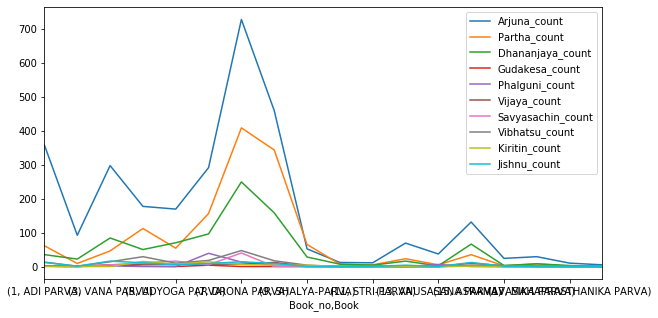

In [117]:
arjun_names_book.plot(legend=True)

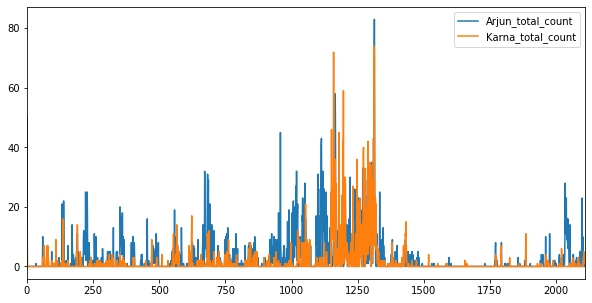

In [120]:
charsdf_final.plot(legend=True)

In [121]:
both_arj_kar.head()

,Book_no,Book,Section,Content,Karna_total_count,Arjun_total_count
0,1,ADI PARVA,I,"['', 'Om! Having bowed down to Narayana and Na...",8,32
1,1,ADI PARVA,II,"['', '""The Rishis said, \'O son of Suta, we wi...",16,50
2,1,ADI PARVA,III,"['', '(Paushya Parva)', '', 'Sauti said, ""Jana...",0,0
3,1,ADI PARVA,IV,"['', '(Pauloma Parva)', '', ""'UGRASRAVA SAUTI,...",0,0
4,1,ADI PARVA,V,"['', '(Pauloma Parva continued)', '', '""Saunak...",0,0


# Part 3

# WordCloud

</br >
<center>
<img src="mahabharata_images/second.jpg" width=600 />
</center>

In [ ]:
conda install gensim

In [122]:
from __future__ import absolute_import, division, print_function

In [123]:
#word encoding
import codecs
#finds all pathnames matching a pattern, like regex
import glob
import logging
import multiprocessing
import os
import pprint
#regular expressions
import re
import nltk
#Gensim is a free Python library designed to automatically extract semantic topics from documents,
import gensim.models.word2vec as w2v
#dimensionality reduction
import sklearn.manifold
#math
import numpy as np
#plotting
import matplotlib.pyplot as plt
#parse dataset
import pandas as pd
#visualization (conda install -c anaconda seaborn=0.7.1)
import seaborn as sns


In [124]:
nltk.download("punkt")
nltk.download("stopwords")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ankur\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ankur\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [125]:
#The glob.glob returns the list of files with their full path (unlike os.listdir()) and 
#is more powerful than os.listdir that does not use wildcards. In addition, glob contains 
#the os, sys and re modules.
#sorted is for sorting the files in an order
book_filenames = sorted(glob.glob("C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/mahafull.txt"))



# Combine the book into one string¶



In [126]:
#initialize raw unicode , we'll add all text to this file in memory
corpus_raw = u""

#for each book, read it, open it in utf 8 format, 
#add it to the raw corpus
for book_filename in book_filenames:
    print("Reading '{0}'...".format(book_filename))
    with codecs.open(book_filename, "r", "utf-8") as book_file:
        corpus_raw += book_file.read()
    print ("Corpus is now {0} characters long".format(len(corpus_raw)))
    print () 

Reading 'C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/mahafull.txt'...
Corpus is now 15186494 characters long



# Split the corpus into sentences¶

In [127]:
#tokenizastion -A tokenizer that divides a string into substrings by splitting on the specified string 
#    (defined in subclasses).

tokenizer = nltk.data.load('tokenizers/punkt/english.pickle')

In [128]:
#tokenize into sentences
raw_sentences = tokenizer.tokenize(corpus_raw)

In [129]:
#convert into a list of words
#remove unnnecessary, split into words, no hyphens
#list of words
def sentence_to_wordlist(raw):
    clean = re.sub("[^a-zA-Z]"," ", raw)
    words = clean.split()
    return words


In [130]:
#sentence where each word is tokenized
sentences = []
for raw_sentence in raw_sentences:
    if len(raw_sentence) > 0:
        sentences.append(sentence_to_wordlist(raw_sentence))

In [131]:
# Example
print(raw_sentences[5])
print(sentence_to_wordlist(raw_sentences[5]))


Those unacquainted with any language but their own
are generally very exclusive in matters of taste.
['Those', 'unacquainted', 'with', 'any', 'language', 'but', 'their', 'own', 'are', 'generally', 'very', 'exclusive', 'in', 'matters', 'of', 'taste']


In [132]:
token_count = sum([len(sentence) for sentence in sentences])
print("The book contains {0:,} tokens.".format(token_count))

The book corpus contains 2,580,074 tokens.



#Build model¶


In [133]:
# Dimensionality of the resulting word vectors.
# more dimensions, more computationally expensive to train
# but also more accurate
# more dimensions = more generalized
num_features = 500

# Minimum word count threshold.
min_word_count = 7

# Number of threads to run in parallel.
# more workers, faster we train
# cpu_count() essentially tells us the theoretical maximum number of processes we can run at any given moment. 
#If cpu_count() returns 10 , in practice, you will never have 10 workers going at one time. 
#Python turns out to be a polite program.
num_workers = multiprocessing.cpu_count()

# Context window length.
context_size = 25

# Downsample setting for frequent words.
# 0 - 1e-5 is good for this
downsampling = 1e-3

# Seed for the random number generator, to make the results reproducible.
seed = 1

In [134]:
#implement the Word2Vec word embedding technique used for creating word vectors with Python's Gensim library.
#Its input is a text corpus and its output is a set of vectors: feature vectors for words in that corpus.
mahabharata2vec = w2v.Word2Vec(
    sg=1,
    seed=seed,
    workers=num_workers,
    size=num_features,
    min_count=min_word_count,
    window=context_size,
    sample=downsampling
)

In [ ]:
#Build vocabulary from a sequence of documents (can be a once-only generator stream)
mahabharata2vec.build_vocab(sentences)

In [137]:
print("Word2Vec vocabulary length:", len(mahabharata2vec.wv.vocab))

Word2Vec vocabulary length: 11159


In [138]:
print(sentences[0])

['BOOK', 'ADI', 'PARVA', 'TRANSLATOR', 'S', 'PREFACE', 'The', 'object', 'of', 'a', 'translator', 'should', 'ever', 'be', 'to', 'hold', 'the', 'mirror', 'upto', 'his', 'author']


In [ ]:
# word2vec training, this might take few moment

In [139]:
mahabharata2vec.train(sentences[0],epochs=3,total_examples=1000)

(144, 276)

In [140]:
if not os.path.exists("trained"):
    os.makedirs("trained")

In [141]:
mahabharata2vec.save(os.path.join("trained", "mahabharata2vec.w2v"))

In [142]:
mahabharata2vec = w2v.Word2Vec.load(os.path.join("trained", "mahabharata2vec.w2v"))

In [ ]:
#Compress the word vectors into 3D space using t-SNE and plot them for further analysis.

In [152]:
#t-distributed Stochastic Neighbor Embedding.
'''t-Distributed Stochastic Neighbor Embedding (t-SNE) is a dimensionality reduction technique used to 
represent high-dimensional dataset in a low-dimensional space of two or three dimensions so that we can 
visualize it. t-SNE creates a reduced feature space where similar samples are modeled by nearby points 
and dissimilar samples are modeled by distant…
'''
tsne = sklearn.manifold.TSNE(n_components=3,perplexity=15.0, n_iter=20000,random_state=0)
tsne

TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
     method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
     n_components=3, n_iter=20000, n_iter_without_progress=300, perplexity=15.0,
     random_state=0, verbose=0)

In [144]:
#The syn0 array essentially holds raw word-vectors. 
#From the perspective of the neural-network used to train word-vectors, 
#these vectors are a 'projection layer' that can convert a one-hot encoding of a word into a 
#dense embedding-vector of the right dimensionality. 
#Embeddings is a python package that provides pretrained word embeddings for natural language processing 
#and machine learning.
all_word_vectors_matrix = mahabharata2vec.wv.syn0

C:\Users\ankur\Anaconda2\envs\py36\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `syn0` (Attribute will be removed in 4.0.0, use self.vectors instead).
  import sys


In [ ]:
all_word_vectors_matrix

In [145]:
import gc
gc.collect()

116

In [146]:
#Fit X into an embedded space and return that transformed output.
# all_word_vectors_matrix_3d Embedding of the training data in low-dimensional space.
all_word_vectors_matrix_3d = tsne.fit_transform(all_word_vectors_matrix)

In [ ]:
points = pd.DataFrame(
    [
        (word, coords[0], coords[1], coords[2])
        for word, coords in [
            (word, all_word_vectors_matrix_3d[mahabharata2vec.wv.vocab[word].index])
            for word in mahabharata2vec.wv.vocab
        ]
    ],
    columns=["word", "x", "y", "z"]
)
points

In [148]:
if not os.path.exists("points_output"):
    os.makedirs("points_output")
points.to_csv(os.path.join("points_output", "points_threeD.csv"), sep=',')

In [149]:
points.head(10)

,word,x,y,z
0,BOOK,131.273956,-43.913494,-81.256783
1,PARVA,-70.627724,23.836510,-36.057259
2,The,81.994347,42.954407,-53.249973
3,object,-67.236458,-107.075272,-6.592331
4,of,89.851219,9.866367,-15.248252
5,a,-111.812149,-48.183910,7.912848
6,translator,-6.246082,81.772881,21.191565
7,should,51.414387,-87.617340,-30.097197
8,ever,63.361195,19.375380,-34.850311
9,be,91.787346,95.461517,-11.062378


In [150]:
sns.set_context("poster")

In [170]:
all_words

0                  BOOK
1                 PARVA
2                   The
3                object
4                    of
              ...      
11154            Egoism
11155        Vajradatta
11156    Vichitraviryya
11157          Satayupa
11158            Parana
Name: word, Length: 11159, dtype: object

# Proper noun extraction, to get a good picture of all the characters in the book.

In [162]:
all_words = points.word
all_words_df = pd.DataFrame(all_words)
all_words_list = all_words_df['word'].values.tolist()
str_words = ' '.join(all_words_list)
str_words


'BOOK PARVA The object of a translator should ever be to hold the mirror his author That being so chief duty is represent far as manner in which s ideas have been expressed retaining if possible at sacrifice and taste all language well In regard from Sanskrit nothing than dish up Hindu make them agreeable English But endeavour present has give following literal rendering great work Vyasa To reader there much that will strike ridiculous Those unacquainted with any but their own are generally very exclusive matters Having no knowledge other what they meet tongue standard formed purity composition must necessarily narrow one however would ill discharge for sake avoiding ridicule he sacrificed original He not please those entirely him Mr translation close adherence even against called Free means dressing an garb whom introduced C says I am sensible attempt For instance worshipping feet god men though it frequently occurs Indian undoubtedly move laughter especially happen belong class who a

In [ ]:
essays = str_words
tokens = nltk.word_tokenize(essays)
tagged = nltk.pos_tag(tokens)
nouns = [word for word,pos in tagged if (pos == 'NNP') or (pos == 'NNPS')]
print ("Number of nouns is {}.".format(len(nouns)))

#join into a string
joined = "\n".join(nouns).encode('utf-8')
into_string = str(nouns)

#write in an csv file
#output = open("Proper_noun.csv", "w")
#output.write(joined)
#output.close()

#print as a table
noun_string = " ".join(nouns).encode('utf-8')
nouns_df = pd.DataFrame(nouns)
nouns_df.head(10)
#


In [159]:
from PIL import Image
wine_mask = np.array(Image.open("C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/kri.jpeg"))
wine_mask

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

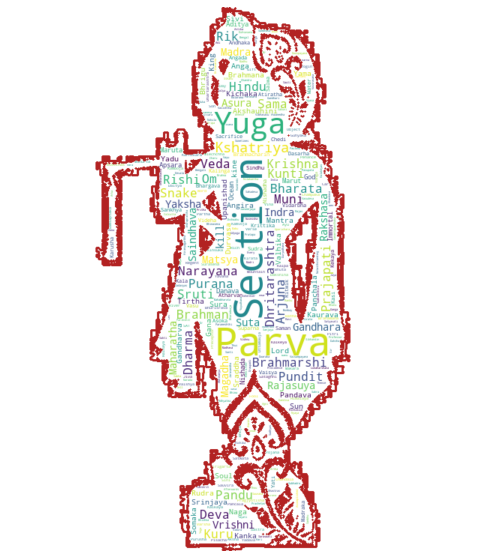

In [210]:
# Create a word cloud image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
stopwords = set(STOPWORDS)

wc = WordCloud(background_color="white", max_words=1000, mask=wine_mask,
               stopwords=stopwords, contour_width=3, contour_color='firebrick')


new_string = noun_string.decode()
# Generate a wordcloud
wc.generate(new_string)

# store to file
wc.to_file("C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/krishna1.jpeg")
# show
plt.figure(figsize=[20,10])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [189]:
import sys
print(sys.executable)

C:\Users\ankur\Anaconda2\envs\py36\python.exe


In [190]:
number_noun = 0
noun_points = pd.DataFrame()
noun_string_to_word = sentence_to_wordlist(newString)
all_words = points.word

for noun_wrd in range(len(noun_string_to_word)):
    for wrd_sl_no in range(len(points)):
        if noun_string_to_word[noun_wrd] == all_words[wrd_sl_no]:
            noun_points_old = points.iloc[[wrd_sl_no]]
            noun_points = noun_points.append(noun_points_old)


In [168]:
type(noun_points)
#print (noun_points)
noun_points.to_csv(os.path.join("points_output", "noun_points_threeD.csv"), sep=',')



# Scatter plot of all the proper nouns¶


In [ ]:
noun_points.plot.scatter("x", "y", c = "z", s=20, figsize=(12, 12))

# PART 4 : Text Summarisation

</br >
<center>
<img src="mahabharata_images/mahabharat.jpg" width=600 />
</center>

In [171]:
from nltk.tokenize import sent_tokenize, word_tokenize 

In [172]:
import nltk.corpus
import nltk
import os

In [174]:

nancydrew = open('C:/Users/ankur/Downloads/mahabharat_text/mhbhrt/mahafull.txt').read()
len(nancydrew)

14951392

In [175]:
def _create_frequency_table(text_string) -> dict:

    stopWords = set(stopwords.words("english"))
    words = word_tokenize(text_string)
    ps = PorterStemmer()

    freqTable = dict()
    for word in words:
        word = ps.stem(word)
        if word in stopWords:
            continue
        if word in freqTable:
            freqTable[word] += 1
        else:
            freqTable[word] = 1

    return freqTable

In [176]:
sentence = sent_tokenize(nancydrew)


In [177]:

def _score_sentences(sentences, freqTable) -> dict:
    sentenceValue = dict()

    for sentence in sentences:
        word_count_in_sentence = (len(word_tokenize(sentence)))
        for wordValue in freqTable:
            if wordValue in sentence.lower():
                if sentence[:10] in sentenceValue:
                    sentenceValue[sentence[:10]] += freqTable[wordValue]
                else:
                    sentenceValue[sentence[:10]] = freqTable[wordValue]

        sentenceValue[sentence[:10]] = sentenceValue[sentence[:10]] // word_count_in_sentence

    return sentenceValue


In [178]:
def _find_average_score(sentenceValue) -> int:
    sumValues = 0
    for entry in sentenceValue:
        sumValues += sentenceValue[entry]

    # Average value of a sentence from original text
    average = int(sumValues / len(sentenceValue))

    return average

In [179]:

def _generate_summary(sentences, sentenceValue, threshold):
    sentence_count = 0
    summary = ''

    for sentence in sentences:
        if sentence[:10] in sentenceValue and sentenceValue[sentence[:10]] > (threshold):
            summary += " " + sentence
            sentence_count += 1

    return summary

In [180]:
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize, sent_tokenize

# 1 Create the word frequency table
freq_table = _create_frequency_table(nancydrew)

'''
We already have a sentence tokenizer, so we just need 
to run the sent_tokenize() method to create the array of sentences.
'''

# 2 Tokenize the sentences
sentences = sent_tokenize(nancydrew)

# 3 Important Algorithm: score the sentences
sentence_scores = _score_sentences(sentences, freq_table)

# 4 Find the threshold
threshold = _find_average_score(sentence_scores)

# 5 Important Algorithm: Generate the summary
summary = _generate_summary(sentences, sentence_scores, 1.5 * threshold)

print(summary)

 The
latter, I found, had been waited upon by Pratapa. All of
them, I was glad to see, approved of the specimen, and then the task of
translating the Mahabharata into English seriously began. The
reasons I adduced were chiefly founded upon the impossibility of one
person translating the whole of the gigantic work. But when it is remembered that the
interpretations given by Nilakantha came down to him from preceptors of
olden days, one should think twice before rejecting Nilakantha as a guide. From these are descended the family of the
Kurus, of the Yadus, and of Bharata; the family of Yayati and of
Ikshwaku; also of all the Rajarshis. Some read the Bharata beginning with the
initial mantra (invocation), others with the story of Astika, others with
Uparichara, while some Brahmanas study the whole. I know thou hast revealed the divine word, even from its
first utterance, in the language of truth. Thou hast called thy present
work a poem, wherefore it shall be a poem. Afterwards, he compo

gratified, all the deities are gratified. This treatise is sanctifying. Besides these, other kinds of wealth should be presented.


In [192]:
freq_table

{'book': 47,
 '1': 50,
 'adi': 42,
 'parva': 494,
 'translat': 275,
 "'S": 1,
 'prefac': 7,
 'object': 1758,
 'ever': 1154,
 'hold': 283,
 'mirror': 27,
 'upto': 3,
 'hi': 23842,
 'author': 134,
 '.': 118149,
 ',': 261276,
 'chief': 1334,
 'duti': 2083,
 'repres': 315,
 'far': 167,
 'practic': 699,
 'manner': 362,
 "'s": 10644,
 'idea': 107,
 'express': 146,
 'retain': 44,
 'possibl': 107,
 'sacrific': 3075,
 'idiom': 3,
 'tast': 240,
 'peculiar': 22,
 'imageri': 1,
 'languag': 61,
 'well': 745,
 'In': 2348,
 'regard': 2674,
 'sanskrit': 24,
 'noth': 598,
 'easier': 1,
 'dish': 42,
 'hindu': 75,
 'make': 1839,
 'agreeabl': 725,
 'english': 16,
 'endeavour': 205,
 'present': 1018,
 'ha': 3443,
 'give': 1767,
 'follow': 1705,
 'page': 7,
 'liter': 196,
 'render': 417,
 'great': 9589,
 'work': 352,
 'vyasa': 483,
 'To': 221,
 'pure': 615,
 'reader': 24,
 'much': 852,
 'strike': 448,
 'ridicul': 56,
 'unacquaint': 48,
 'ani': 2675,
 'gener': 315,
 'veri': 2691,
 'exclus': 26,
 'matter': 51

In [193]:
len(summary)


1166593

In [ ]:
threshold

</br >
<center>
<img src="mahabharata_images/namaste.png" width=600 />
</center>